In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import os

In [3]:
os.chdir('/Users/be2297/Documents/Columbia/Research/Fulfillment/FulfillmentOptimization')
print(os.getcwd())

/Users/be2297/Documents/Columbia/Research/Fulfillment/FulfillmentOptimization


# LOAD AND PRE PROCESS DATA

In [4]:
data = pd.read_csv('test_with_resolving_and_starlike.csv')
data = pd.read_csv('new_resolve_test.csv')
data = pd.read_csv('whole_experiment_n_samples_1000_resolve_samples_80.csv')

data['id_col'] = list(zip(data['graph_name'], data['demand_model'], data['weight_mode'], data['total_inventory']))
only_relaxation_data = data[data['inventory_placement'] == 'offline_relaxation']
relaxation_dict = dict(zip(only_relaxation_data['id_col'], only_relaxation_data['reward']))
data['relaxation_value'] = data['id_col'].map(relaxation_dict)
final_df = data[data['inventory_placement']!= 'offline_relaxation']
final_df['competitive_ratio'] = final_df['reward']/final_df['relaxation_value']
final_df


/var/folders/yj/y3ffb7_s6x33r52w0pq6wc780000gr/T/ipykernel_2181/2789500865.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['competitive_ratio'] = final_df['reward']/final_df['relaxation_value']


,graph_name,demand_model,weight_mode,total_inventory,inventory_placement,fulfillment_algorithm,reward,id_col,relaxation_value,competitive_ratio
1,complete,deter,uniform,30,offline_lp_rounding,offline,27.327497,"(complete, deter, uniform, 30)",27.327497,1.000000
2,complete,deter,uniform,30,offline_lp_rounding,myopic,24.932173,"(complete, deter, uniform, 30)",27.327497,0.912347
3,complete,deter,uniform,30,offline_lp_rounding,fluid_with_rejections,23.461150,"(complete, deter, uniform, 30)",27.327497,0.858518
4,complete,deter,uniform,30,offline_lp_rounding,offline_with_rejections,24.458393,"(complete, deter, uniform, 30)",27.327497,0.895010
5,complete,deter,uniform,30,offline_lp_rounding,fluid_with_rejections_resolving,26.173843,"(complete, deter, uniform, 30)",27.327497,0.957784
...,...,...,...,...,...,...,...,...,...,...
2245,starlike,correl,rewardbased,90,myopic_greedy,myopic,44.575504,"(starlike, correl, rewardbased, 90)",44.935815,0.991982
2246,starlike,correl,rewardbased,90,myopic_greedy,fluid_with_rejections,44.575504,"(starlike, correl, rewardbased, 90)",44.935815,0.991982
2247,starlike,correl,rewardbased,90,myopic_greedy,offline_with_rejections,44.708736,"(starlike, correl, rewardbased, 90)",44.935815,0.994947
2248,starlike,correl,rewardbased,90,myopic_greedy,fluid_with_rejections_resolving,44.559021,"(starlike, correl, rewardbased, 90)",44.935815,0.991615


In [9]:
data['aux_col']=list(zip(data['graph_name'], data['demand_model'], data['weight_mode']))
combs = data['aux_col'].unique()
len(combs)

18

# COMPARE INVENTORY PLACEMENTS FOR FIXED FULFILLMENT ALGORITHM

In [82]:
def plot_all_inventories_for_fixed_fulfillment(df, fulfillment, graph_name, demand_model, weight_mode):
    sub_df = df[(df['graph_name'] == graph_name) & (df['fulfillment_algorithm'] == fulfillment) & (df['demand_model'] ==demand_model )& (df['weight_mode'] == weight_mode )]
    sub_df = sub_df[['inventory_placement', 'total_inventory', 'competitive_ratio']]
    placements = sub_df['inventory_placement'].unique()
    for placement in placements:
        sub_sub_df = sub_df[sub_df['inventory_placement'] == placement].sort_values('inventory_placement')
        plt.plot(sub_sub_df['total_inventory'], sub_sub_df['competitive_ratio'], label = placement, marker= 'o')
    plt.legend()
    plt.ylabel('Competitive Ratio')
    plt.xlabel('Total Inventory')
    plt.title(f'Fulfillment algorithm: {fulfillment}\nGraph: {graph_name}\nDemand model: {demand_model}\nWeights: {weight_mode}')
    plt.show()
    
# plot_all_inventories_for_fixed_fulfillment(final_df, 'myopic', 'longchain', 'correl', 'uniform')

## OFFLINE WITH REJECTIONS AND RE-SOLVING

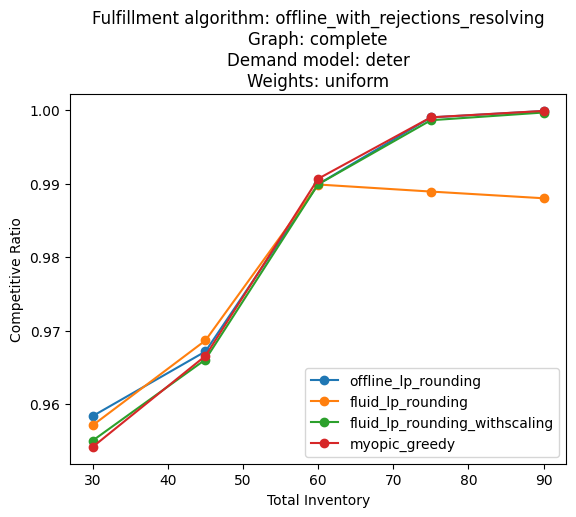

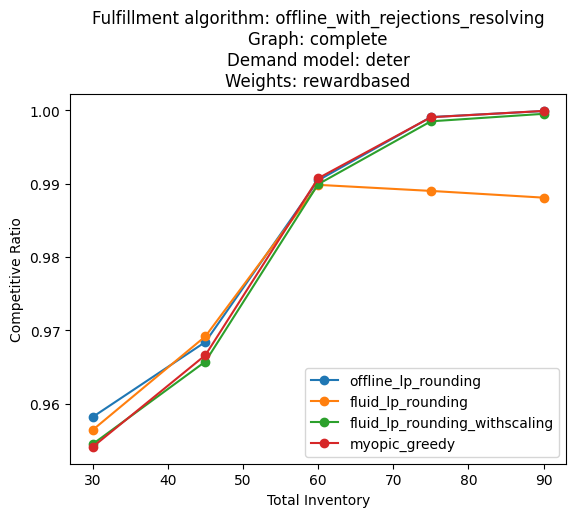

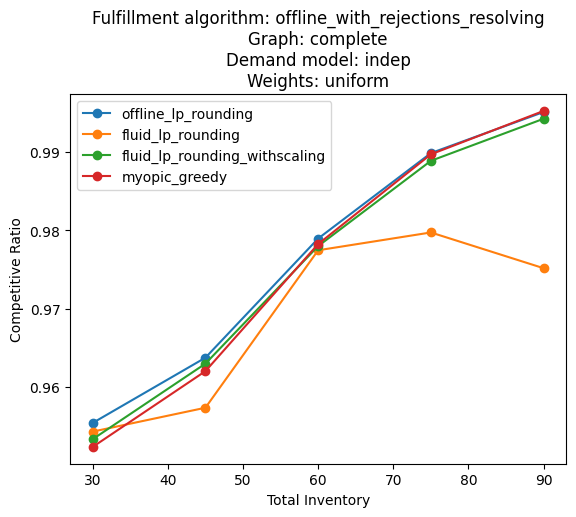

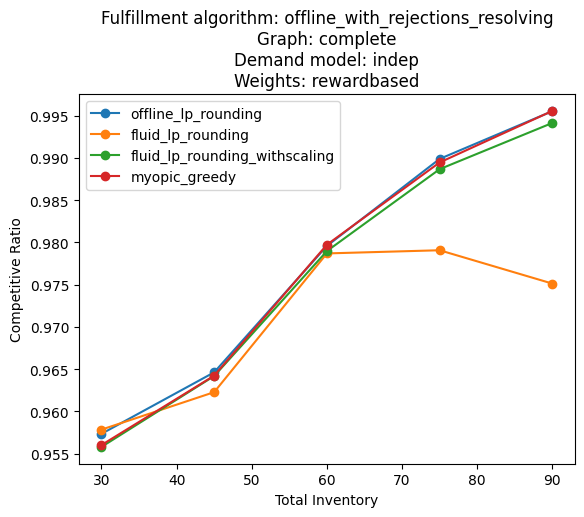

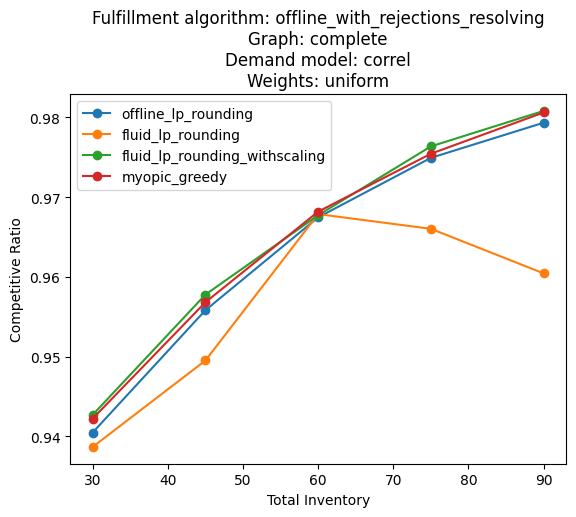

...

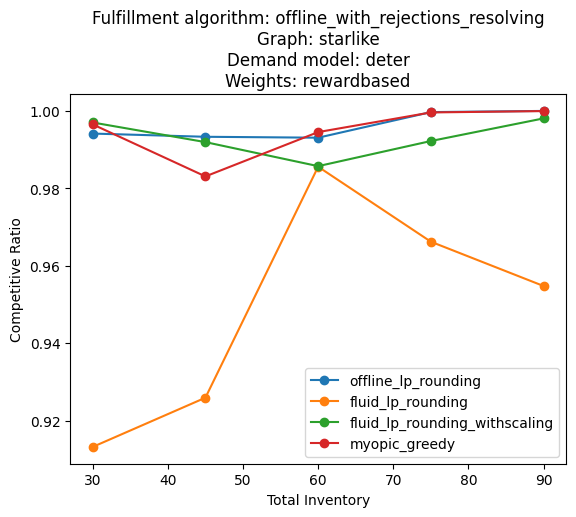

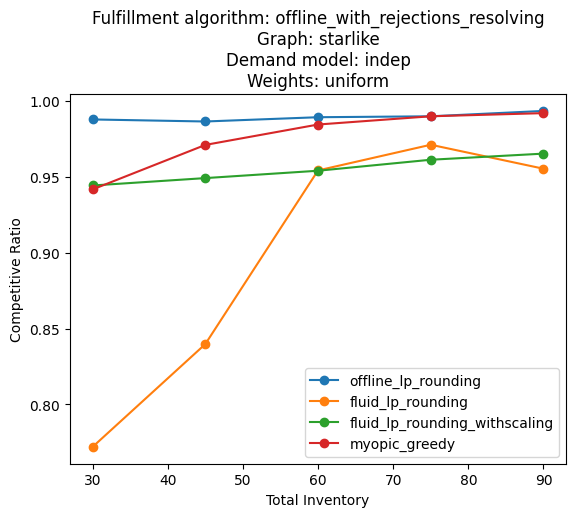

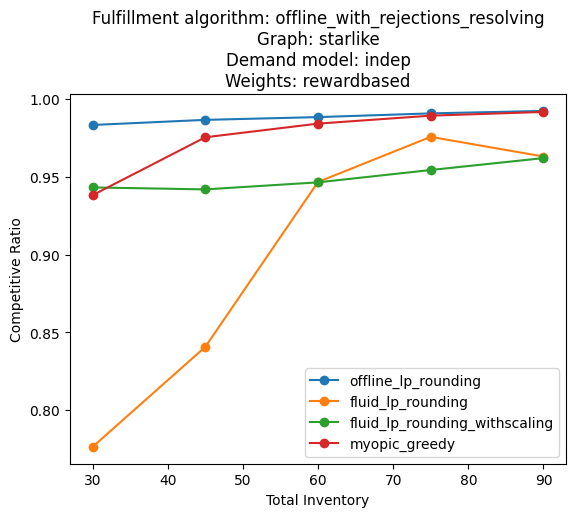

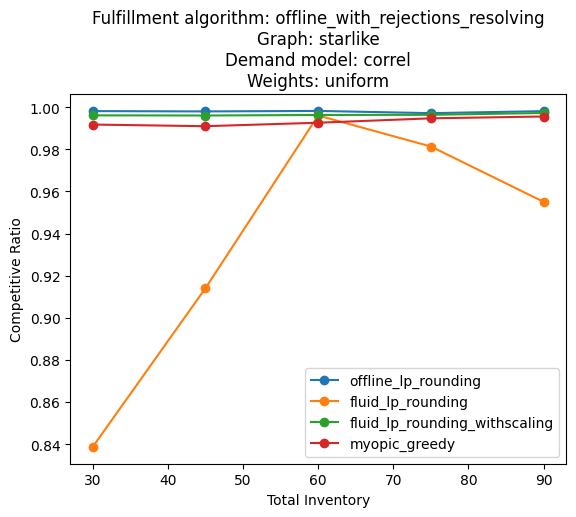

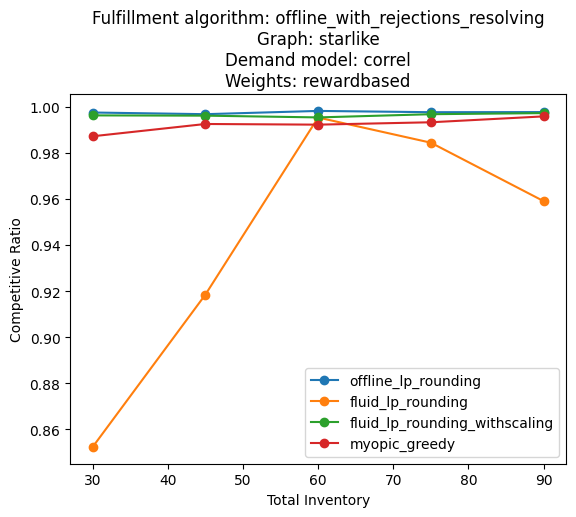

In [83]:
for graph_name, demand_model, weight_mode in combs:
    plot_all_inventories_for_fixed_fulfillment(final_df, 'offline_with_rejections_resolving', graph_name, demand_model, weight_mode)

## OFFLINE WITH REJECTIONS

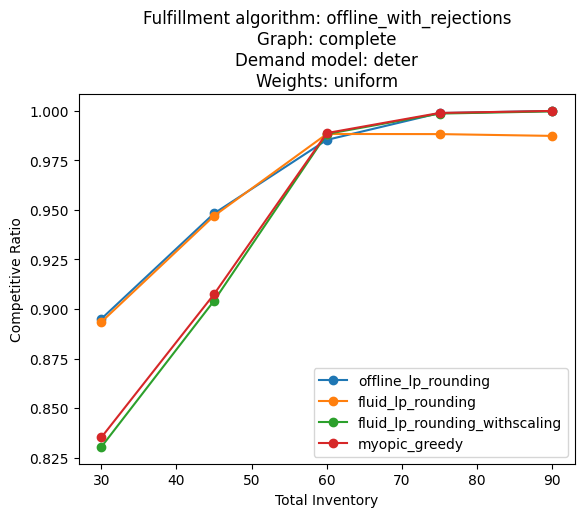

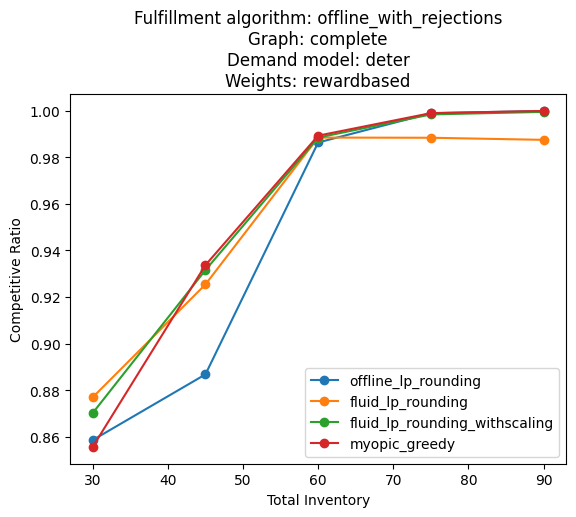

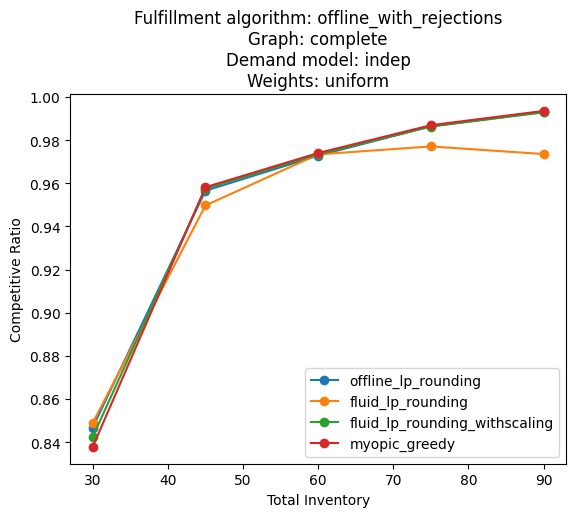

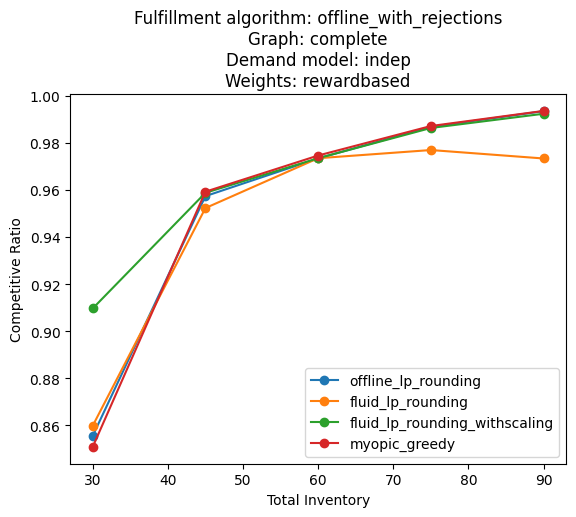

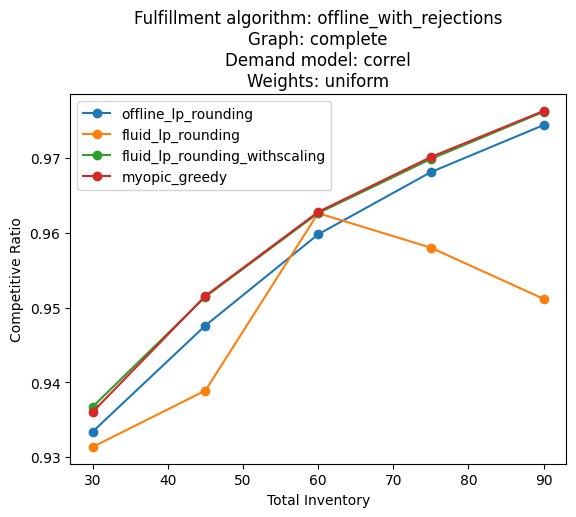

...

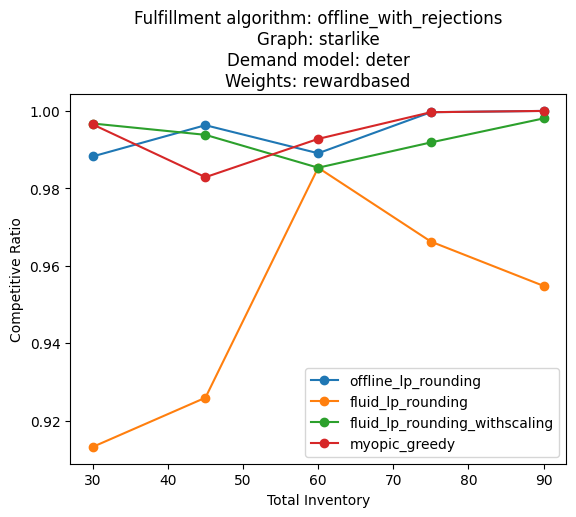

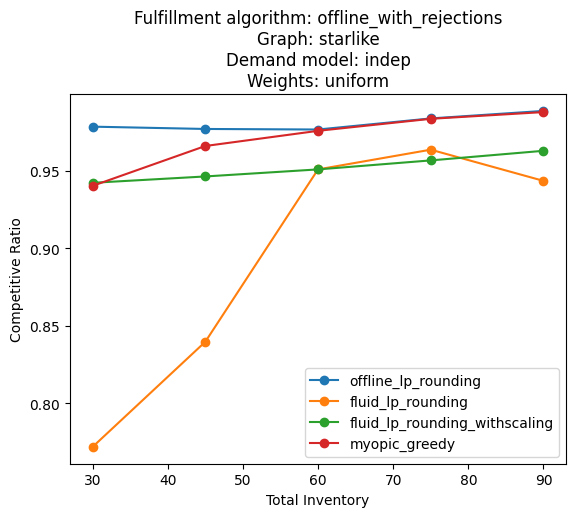

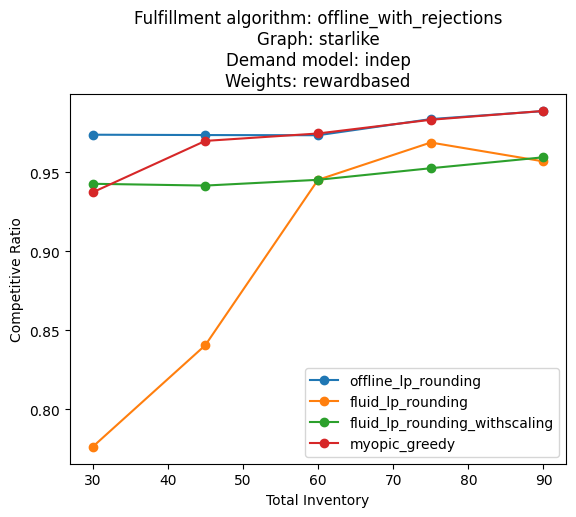

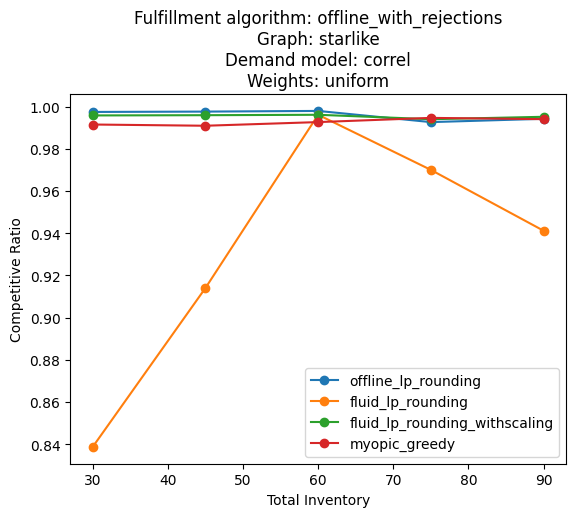

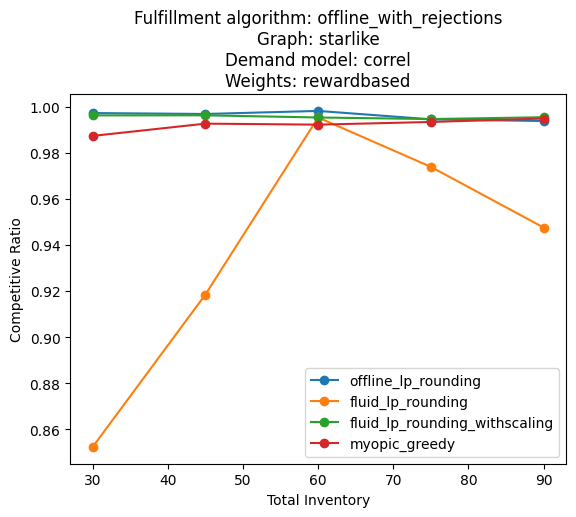

In [84]:
for graph_name, demand_model, weight_mode in combs:
    plot_all_inventories_for_fixed_fulfillment(final_df, 'offline_with_rejections', graph_name, demand_model, weight_mode)

## FLUID WITH REJECTIONS

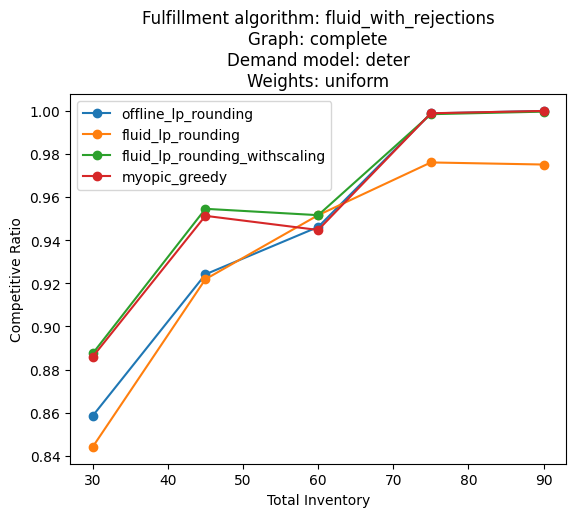

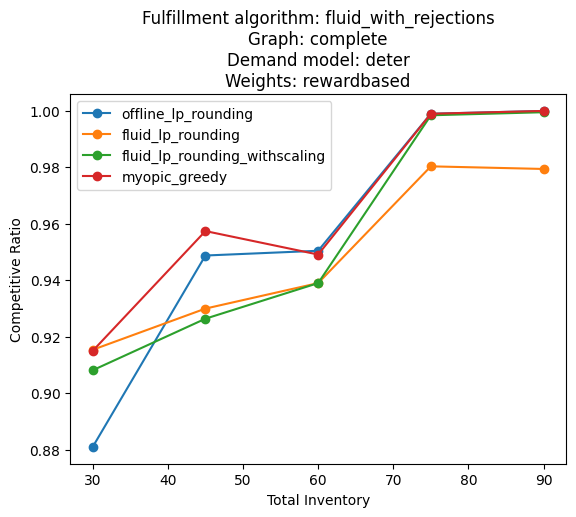

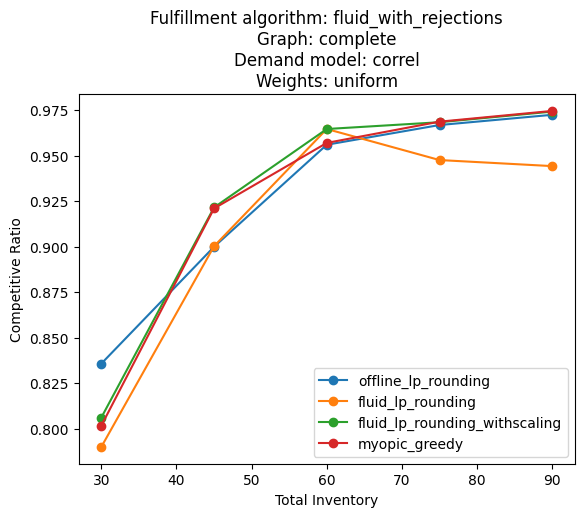

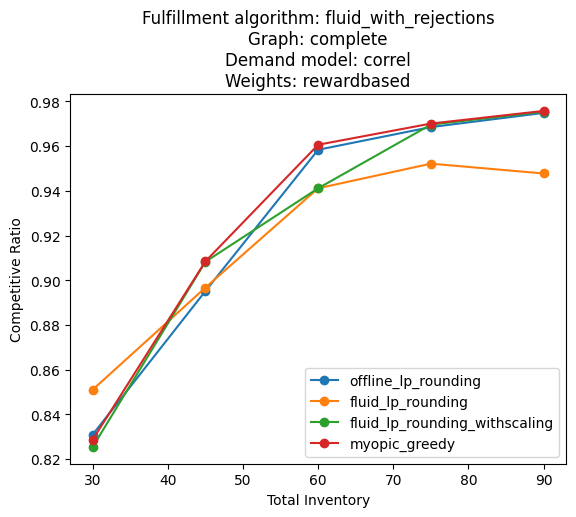

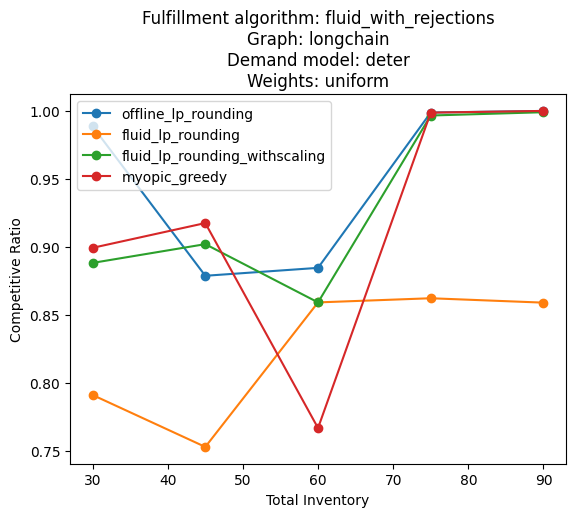

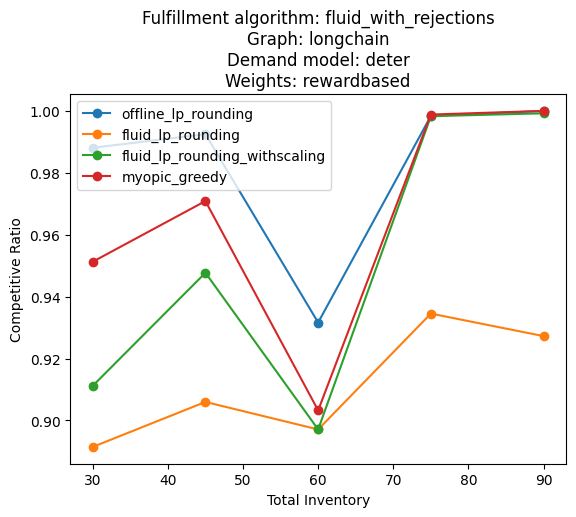

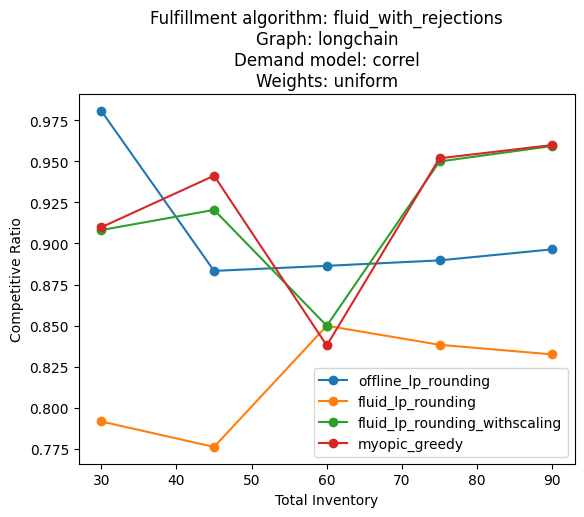

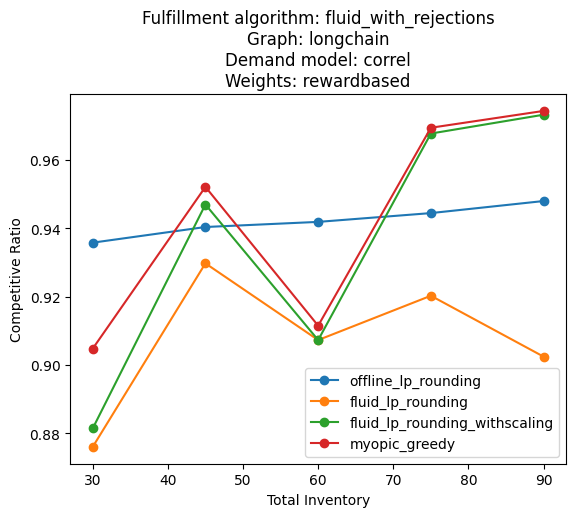

In [43]:
for graph_name, demand_model, weight_mode in combs:
    plot_all_inventories_for_fixed_fulfillment(final_df, 'fluid_with_rejections', graph_name, demand_model, weight_mode)

## MYOPIC

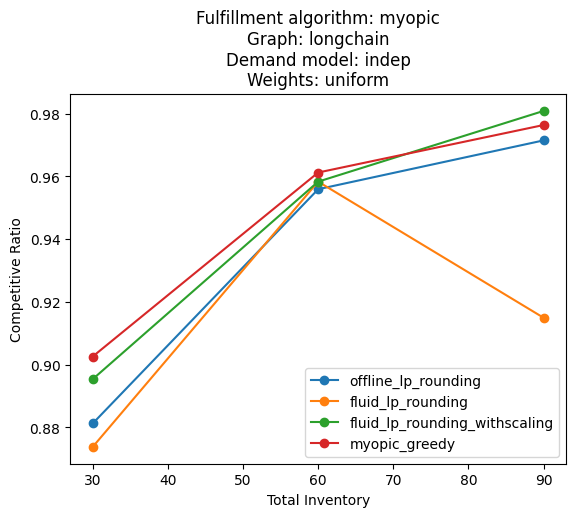

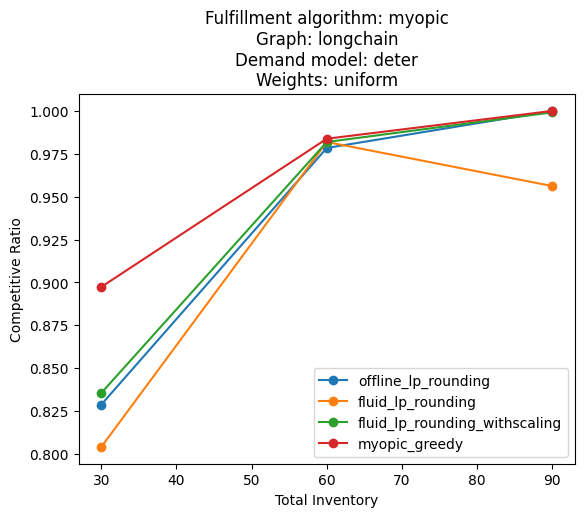

In [10]:
for graph_name, demand_model, weight_mode in combs:
    plot_all_inventories_for_fixed_fulfillment(final_df, 'myopic', graph_name, demand_model, weight_mode)

# COMPARE FULFILLMENT ALGORITHMS FOR FIXED INVENTORY PLACEMENT

In [7]:
def plot_all_fulfillments_for_fixed_inventory(df, inventory, graph_name, demand_model, weight_mode):
    sub_df = df[(df['graph_name'] == graph_name) & (df['inventory_placement'] == inventory) & (df['demand_model'] ==demand_model )& (df['weight_mode'] == weight_mode )]
    sub_df = sub_df[['fulfillment_algorithm', 'total_inventory', 'competitive_ratio']]
    fulfillments = sub_df['fulfillment_algorithm'].unique()
    for fulfillment in fulfillments:
        sub_sub_df = sub_df[sub_df['fulfillment_algorithm'] == fulfillment].sort_values('total_inventory')
        plt.plot(sub_sub_df['total_inventory'], sub_sub_df['competitive_ratio'], label = fulfillment, marker= 'o')
    plt.legend()
    plt.ylabel('Competitive Ratio')
    plt.xlabel('Total Inventory')
    plt.title(f'Inventory placement: {inventory}\nGraph: {graph_name}\nDemand model: {demand_model}\nWeights: {weight_mode}')
    plt.show()
    
# plot_all_fulfillments_for_fixed_inventory(final_df, 'offline_lp_rounding', 'complete', 'deter', 'uniform')

## OFFLINE PLACEMENT

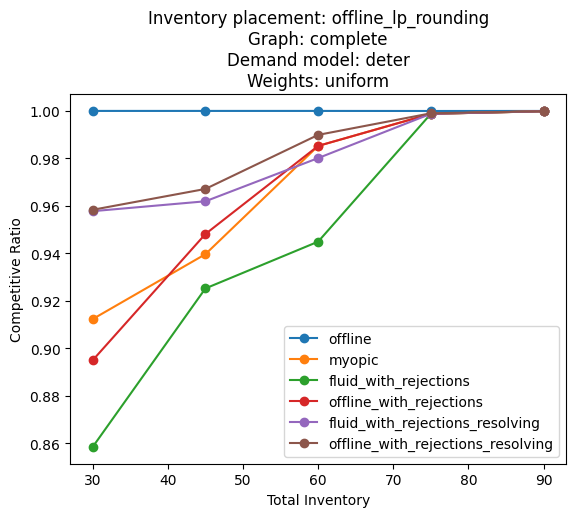

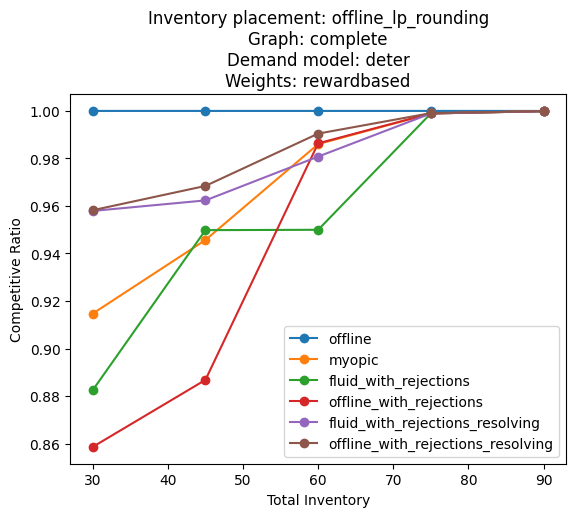

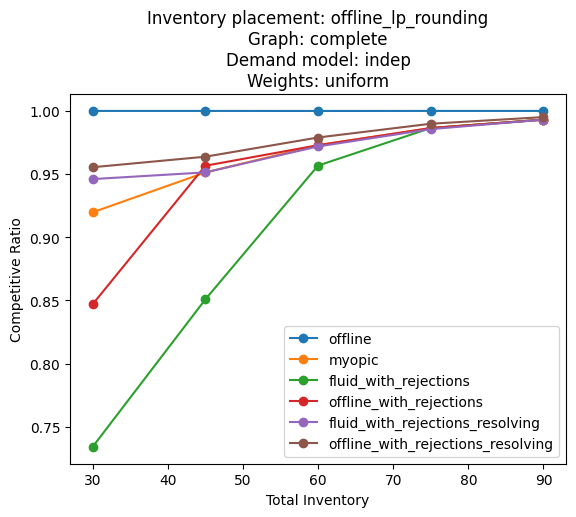

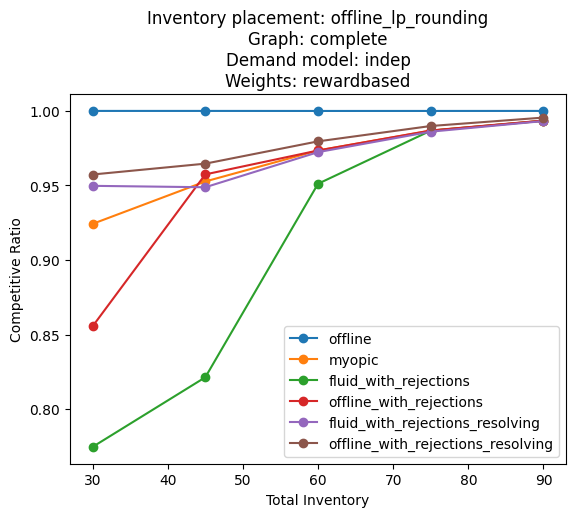

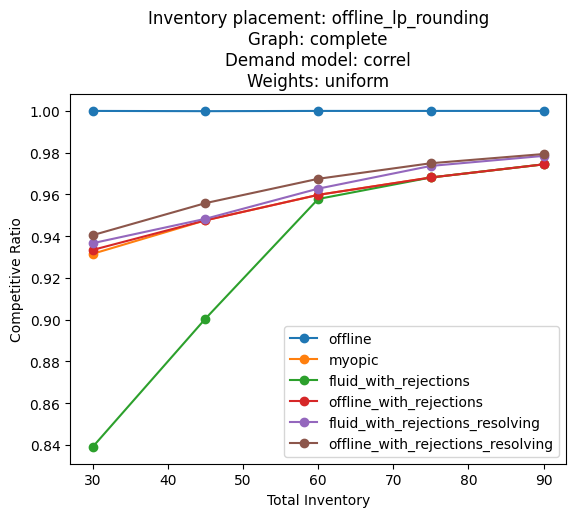

...

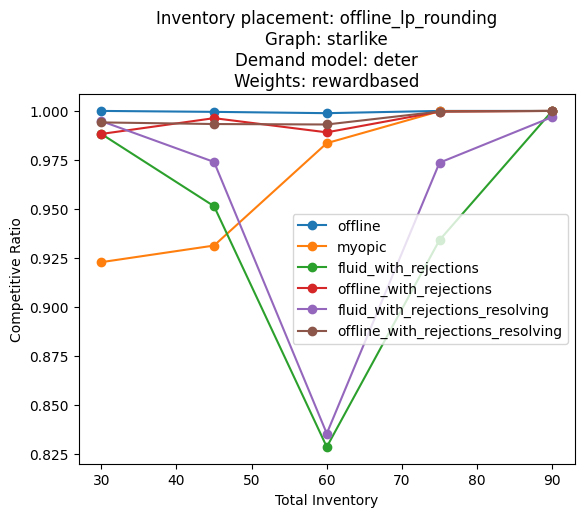

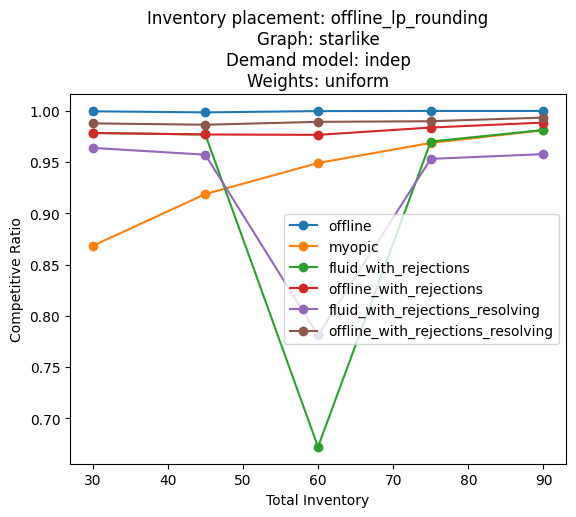

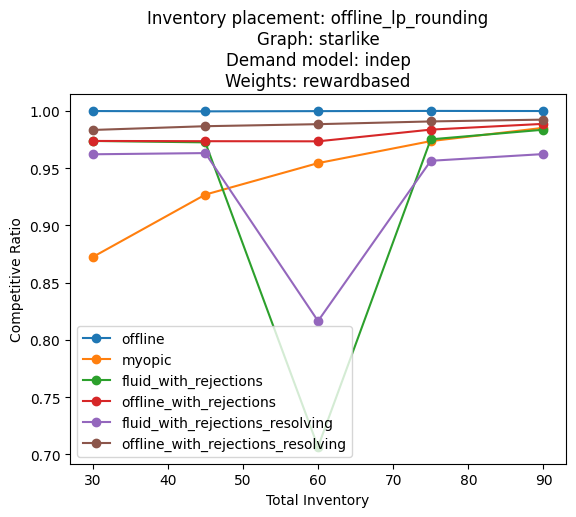

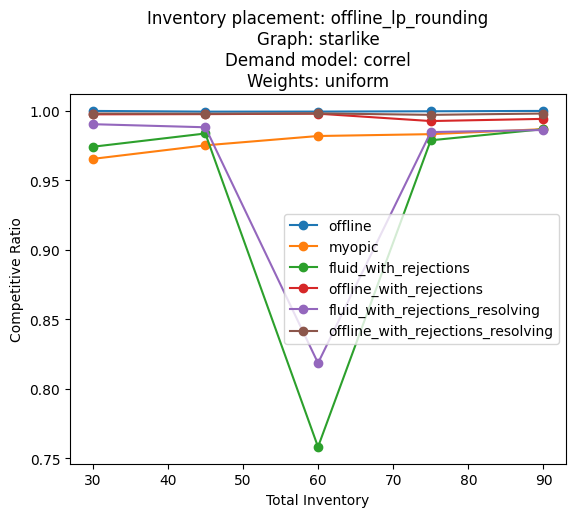

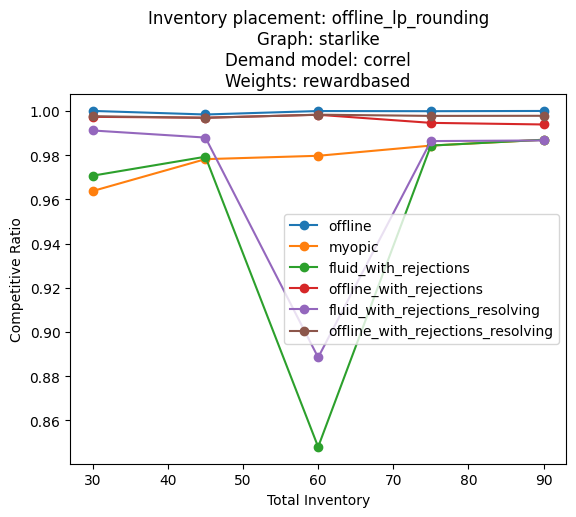

In [11]:
for graph_name, demand_model, weight_mode in combs:
    plot_all_fulfillments_for_fixed_inventory(final_df, 'offline_lp_rounding', graph_name, demand_model, weight_mode)

## FLUID PLACEMENT

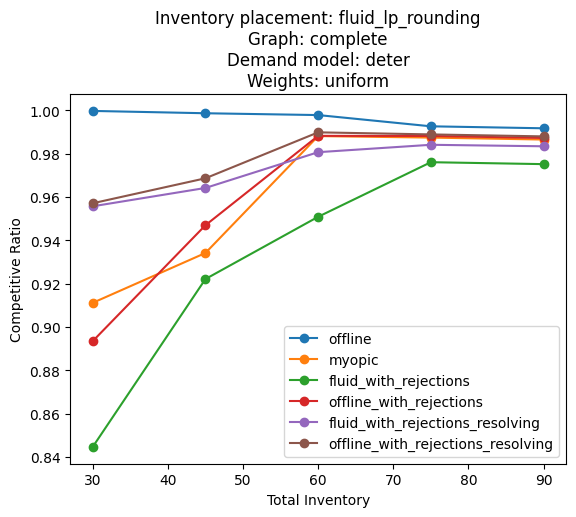

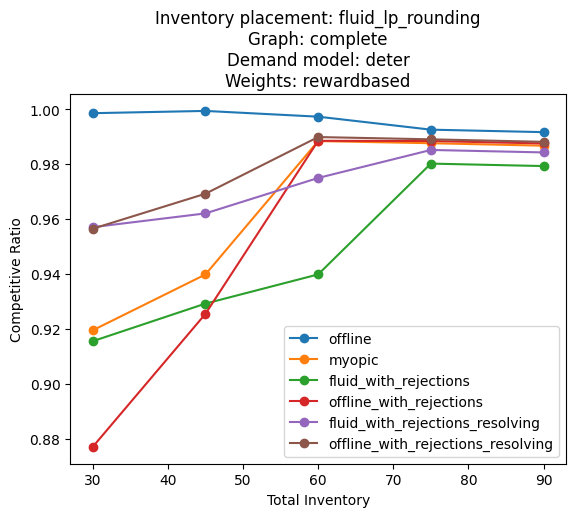

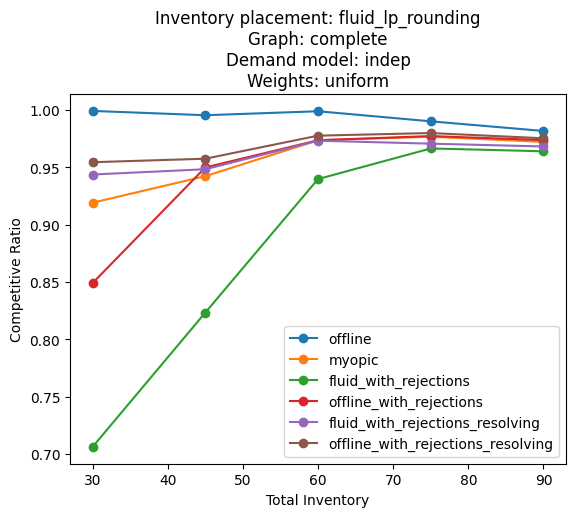

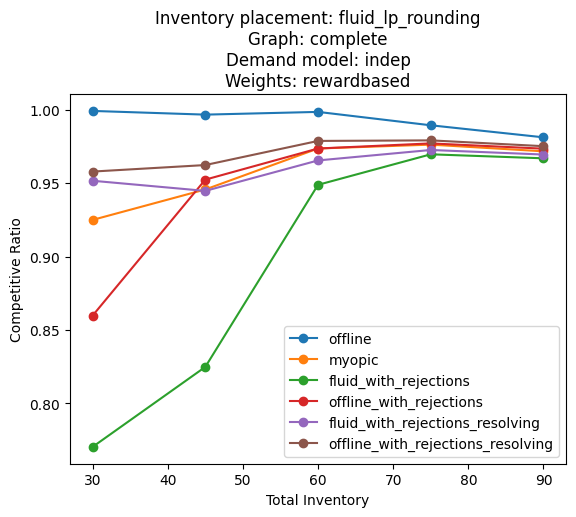

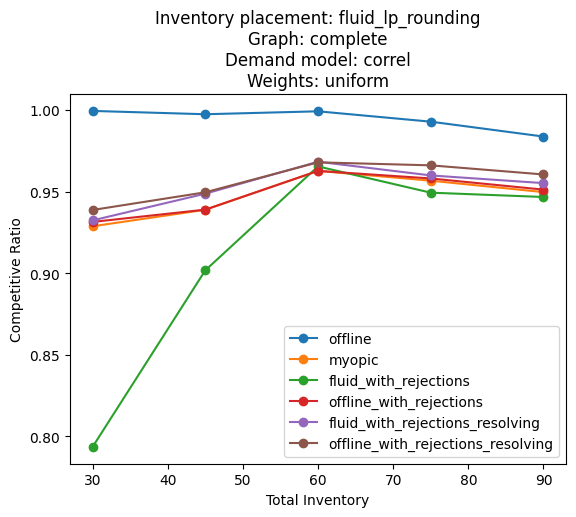

...

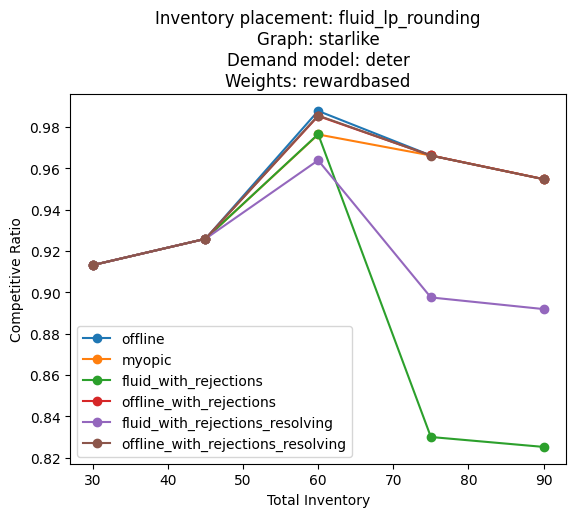

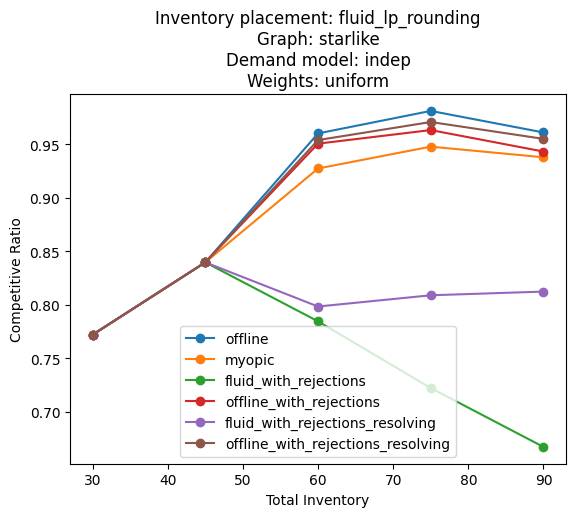

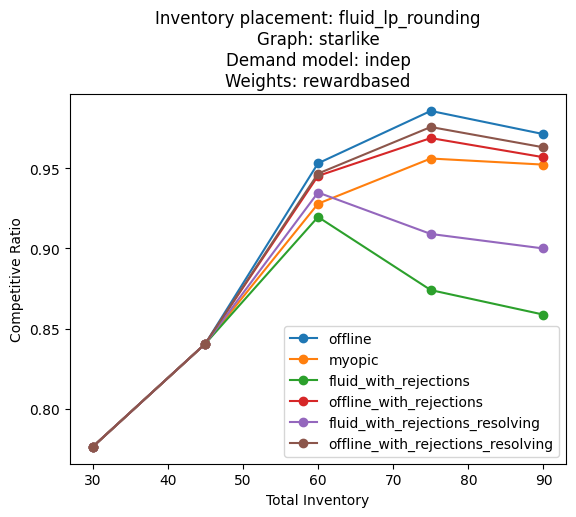

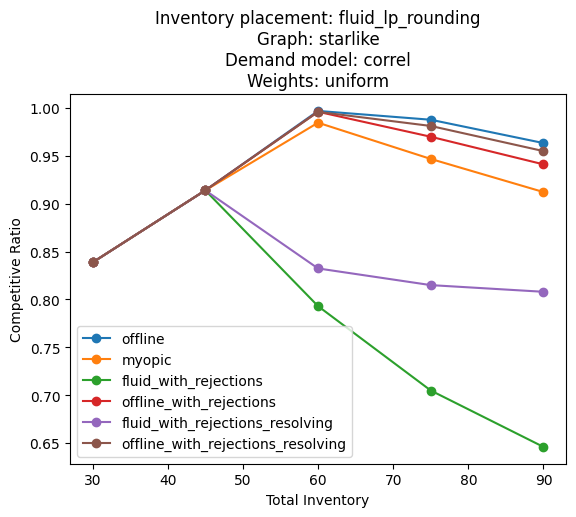

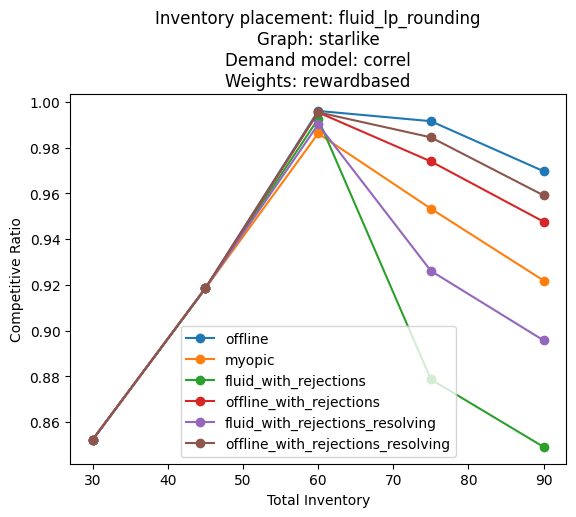

In [87]:
for graph_name, demand_model, weight_mode in combs:
    plot_all_fulfillments_for_fixed_inventory(final_df, 'fluid_lp_rounding', graph_name, demand_model, weight_mode)

## FLUID PLACEMENT SCALED

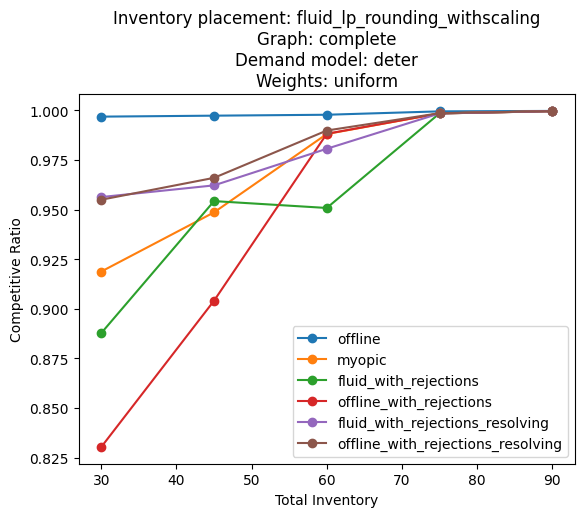

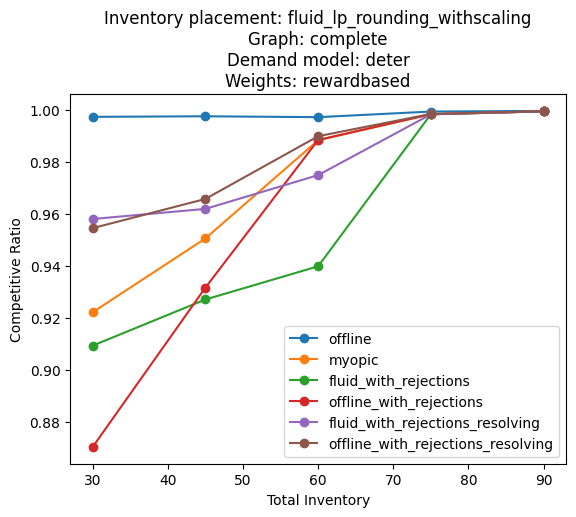

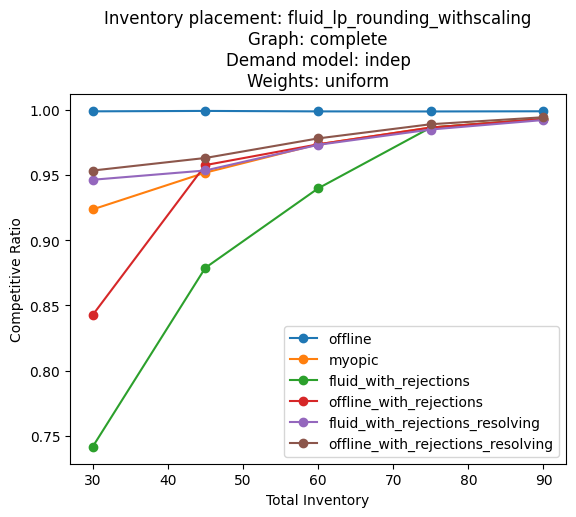

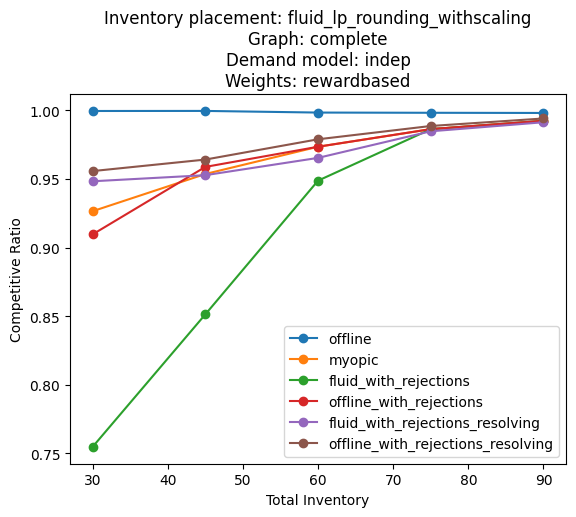

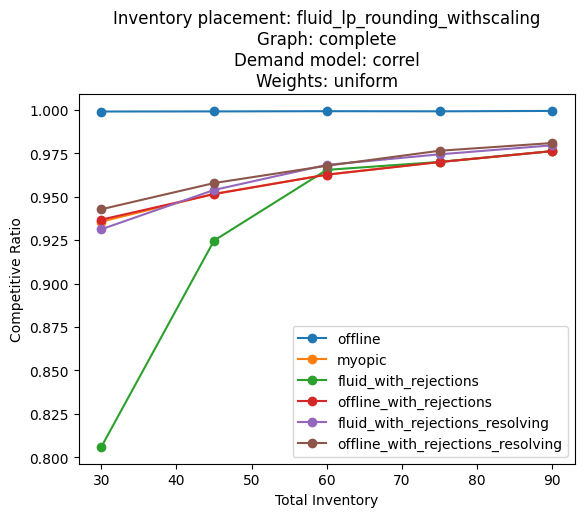

...

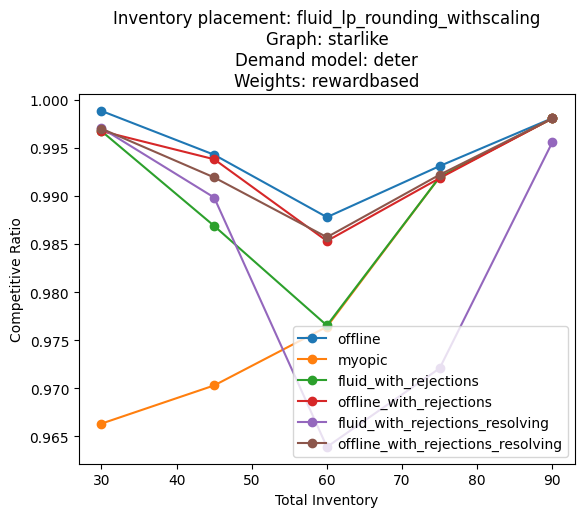

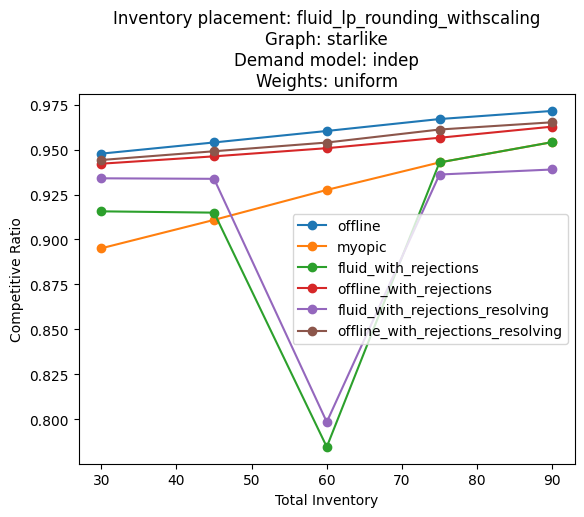

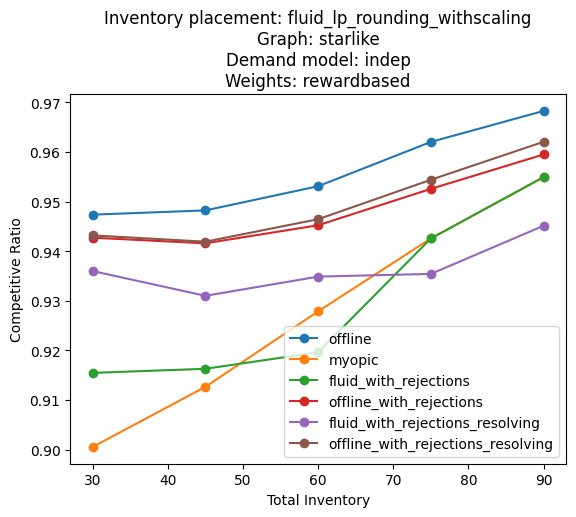

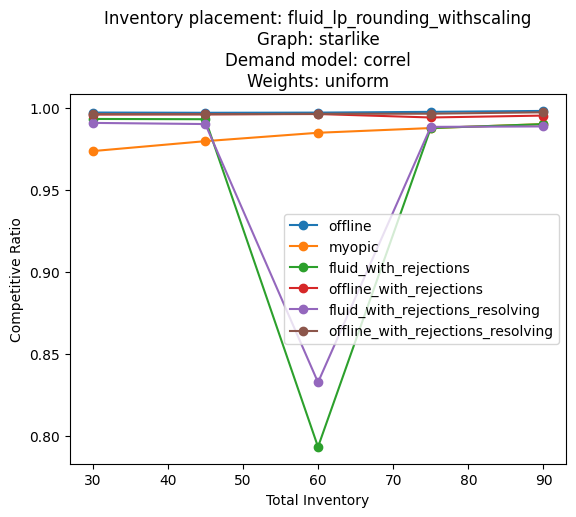

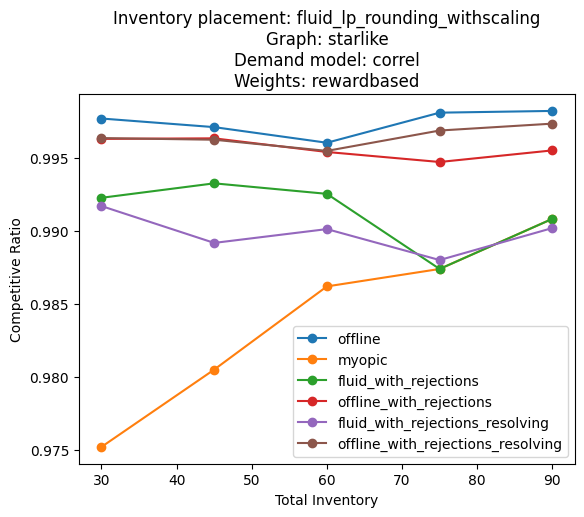

In [10]:
for graph_name, demand_model, weight_mode in combs:
    plot_all_fulfillments_for_fixed_inventory(final_df, 'fluid_lp_rounding_withscaling', graph_name, demand_model, weight_mode)

## MYOPIC PLACEMENT

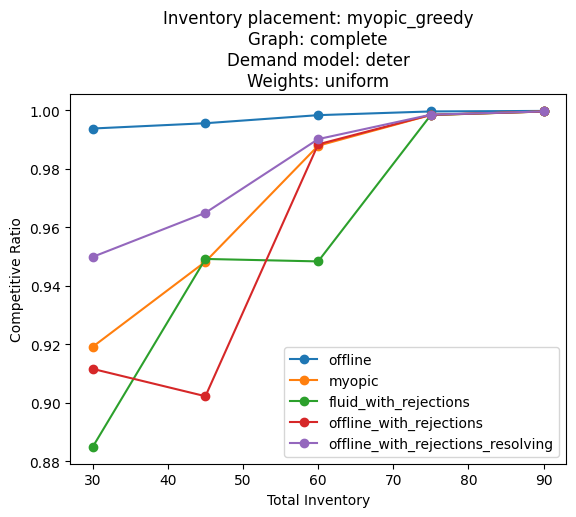

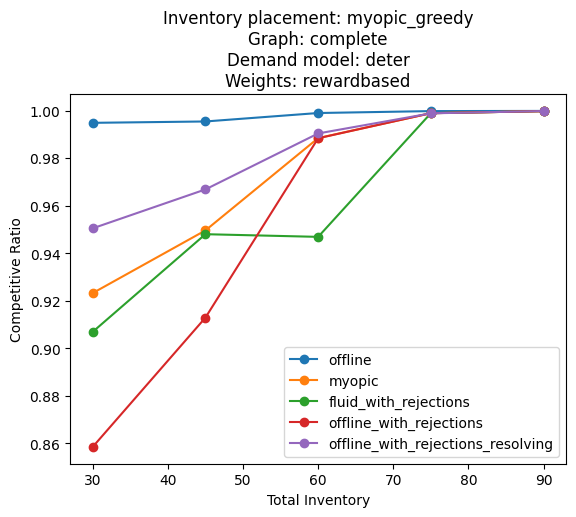

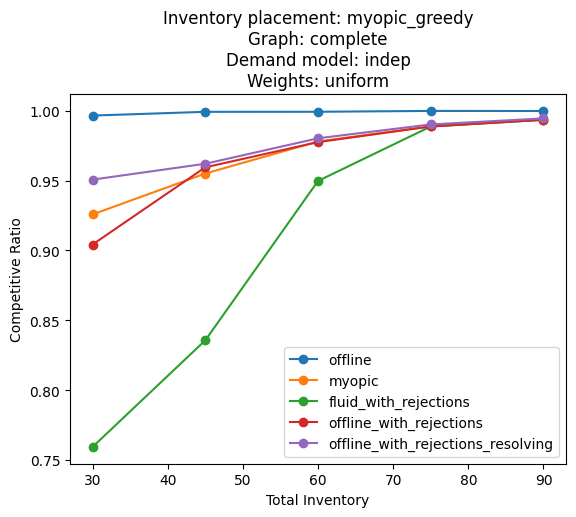

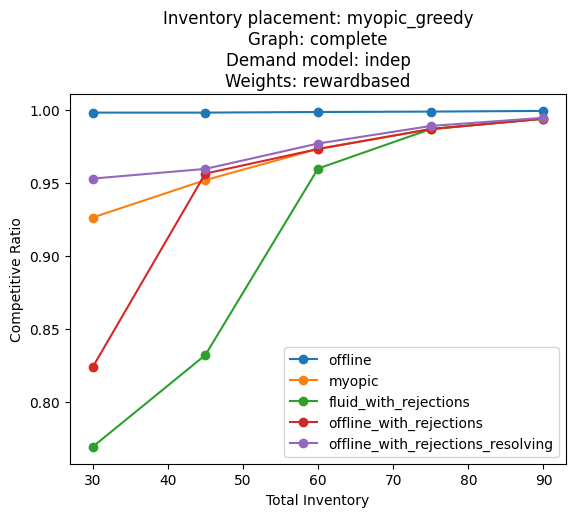

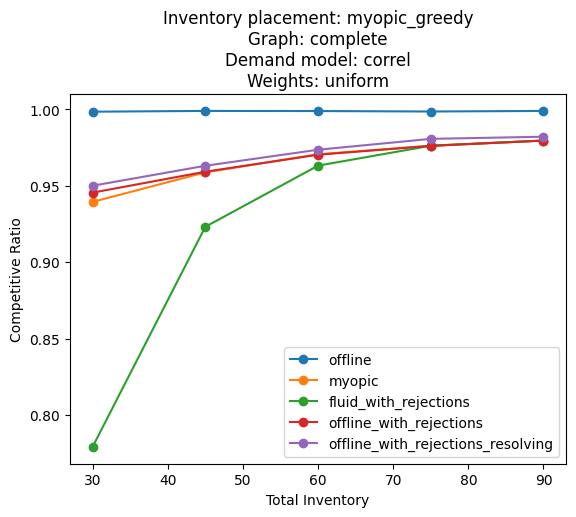

...

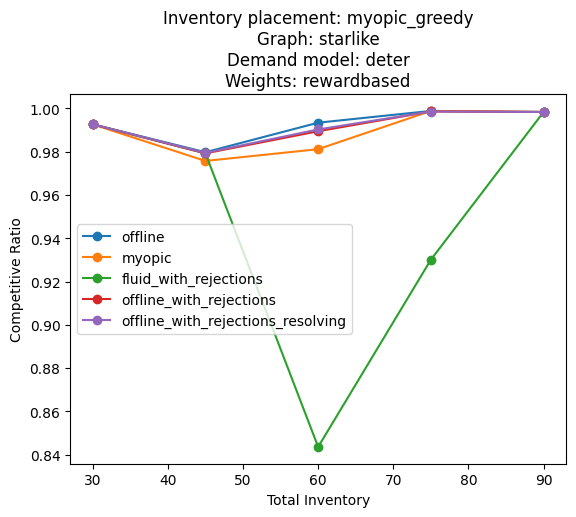

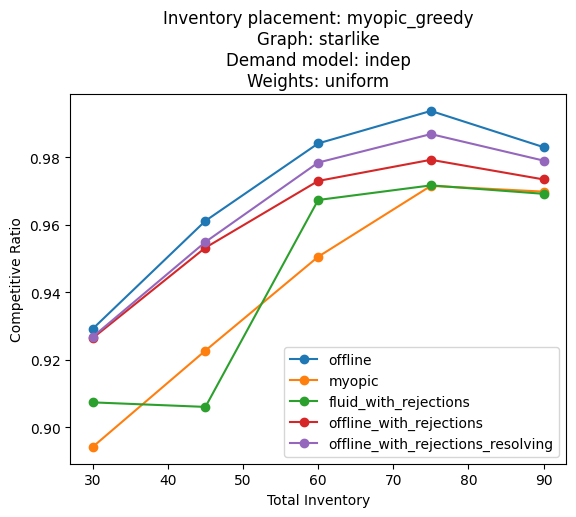

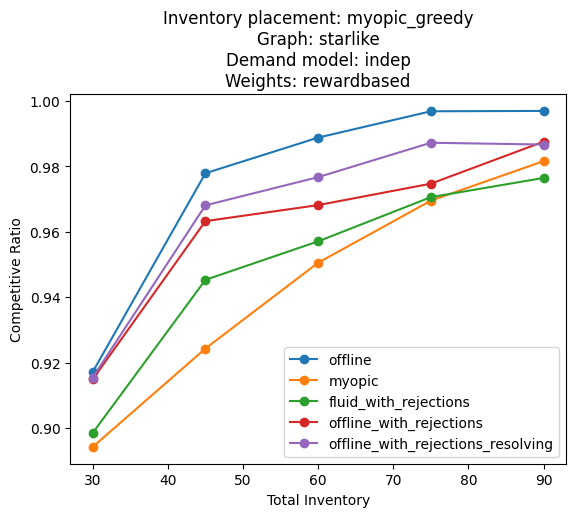

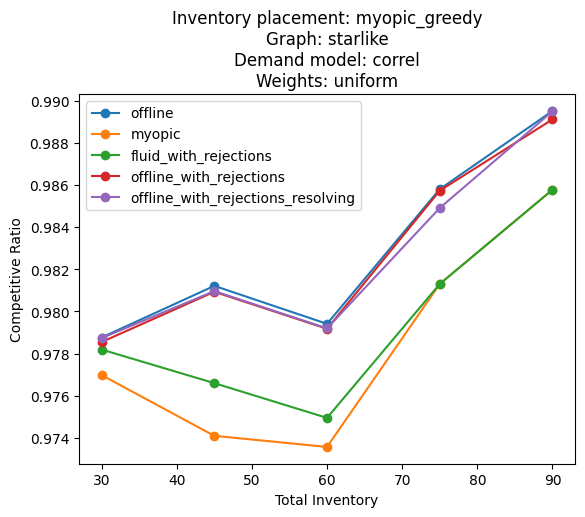

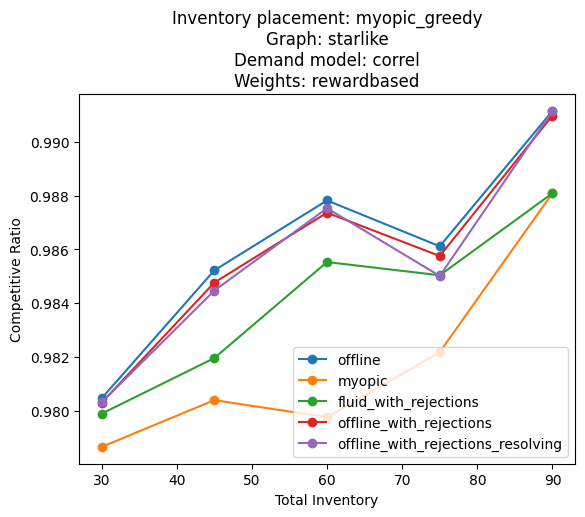

In [63]:
for graph_name, demand_model, weight_mode in combs:
    plot_all_fulfillments_for_fixed_inventory(final_df, 'myopic_greedy', graph_name, demand_model, weight_mode)